In [1]:
#!rm -r old_cache

In [1]:
!rm -r cache

In [2]:
from dataccess.nbfunctions import *
from dataccess import xtcav, query
from dataccess.datashow import show
darks = get_query_dataset('material dark')

Runs:  [85, 89, 97, 127, 200, 340, 379, 436, 662, 875, 881, 892, 900, 905, 910, 924]


### Print timestamps of the dark runs

In [3]:
zip(darks.runs, map(xtcav.get_run_human_time, darks.runs))

[(85, datetime.datetime(2016, 1, 21, 12, 40, 5)),
 (89, datetime.datetime(2016, 1, 21, 12, 53, 46)),
 (97, datetime.datetime(2016, 1, 21, 13, 51, 49)),
 (127, datetime.datetime(2016, 1, 21, 14, 49, 12)),
 (200, datetime.datetime(2016, 1, 21, 17, 20, 21)),
 (340, datetime.datetime(2016, 1, 21, 19, 37, 48)),
 (379, datetime.datetime(2016, 1, 21, 20, 33, 51)),
 (436, datetime.datetime(2016, 1, 21, 21, 24, 14)),
 (662, datetime.datetime(2016, 1, 22, 5, 17)),
 (875, datetime.datetime(2016, 1, 23, 21, 9, 18)),
 (881, datetime.datetime(2016, 1, 23, 21, 35, 20)),
 (892, datetime.datetime(2016, 1, 23, 22, 1, 1)),
 (900, datetime.datetime(2016, 1, 23, 22, 16, 42)),
 (905, datetime.datetime(2016, 1, 23, 23, 25, 6)),
 (910, datetime.datetime(2016, 1, 23, 23, 41, 27)),
 (924, datetime.datetime(2016, 1, 24, 0, 7, 28))]

### Show the difference between successive dark runs. This gives the time variation in pedestals:

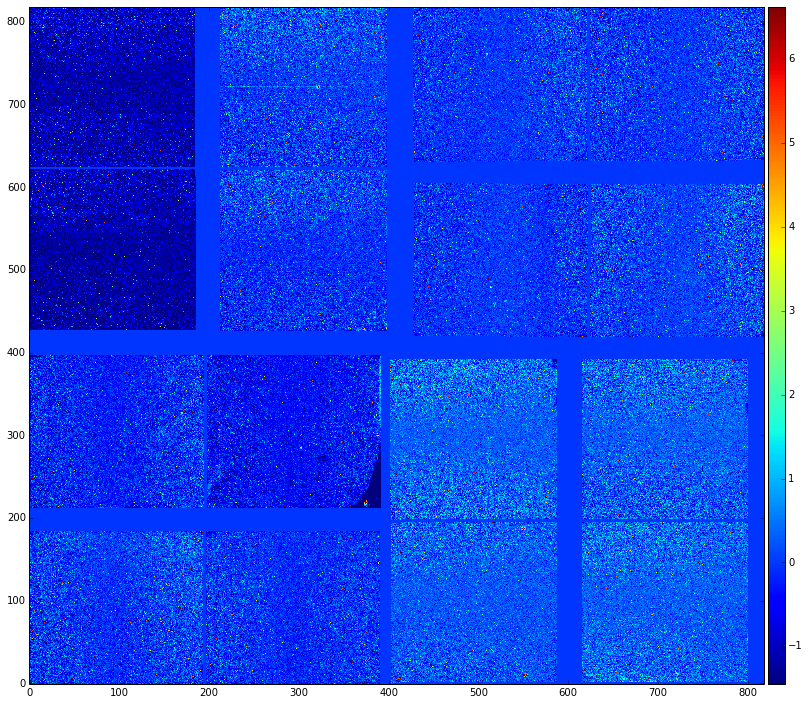

In [3]:
ds = query.DataSet([97], label = 'r%s' % str(97))
t0 = show([ds], 'quad2', darksub = False)

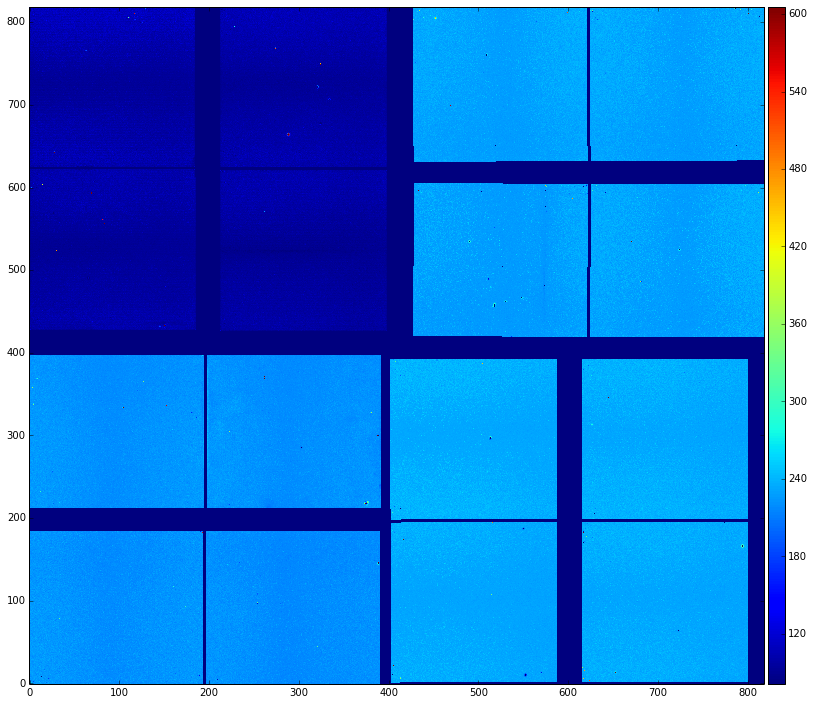

In [8]:
ds = query.DataSet([905], label = 'r%s' % str(905))
t0 = show([ds], 'quad2', darksub = False)

In [10]:
!stat ../masks/quad2_mask_10.11.npy

  File: ‘../masks/quad2_mask_10.11.npy’
  Size: 670841    	Blocks: 1539       IO Block: 1048576 regular file
Device: 5ch/92d	Inode: 330620      Links: 1
Access: (0644/-rw-r--r--)  Uid: (13242/  ohoidn)   Gid: ( 1106/      xu)
Access: 2016-10-11 18:59:11.721004087 -0700
Modify: 2016-10-11 19:00:10.095787160 -0700
Change: 2016-10-11 19:00:10.095787160 -0700
 Birth: -


In [7]:
import config
config.detinfo_map['quad1']

DetInfo(device_name='MecTargetChamber.0:Cspad.0', geometry={'y0': 187, 'phi': 0, 'r': 1041.4, 'x0': 409, 'alpha': 2.33874}, extra_masks=set(['../masks/quad1_mask_10.11.npy']), subregion_index=0)

In [19]:
ls ../masks

81_quad1mask_2_2.mask.npy  mask3.npy             quad2_mask_10.11.npy
dark1.npy                  masks.py
dark2.npy                  quad1_mask_10.11.npy


In [7]:
[get_query_dataset('material MgO runs 870 961 transmission 1. focal_size %d' % spotsize,
                                'MgO.ref.1C.short2.%sum' % spotsize, print_enable = False).runs
                                for spotsize in [4, 8, 18, 28, 38, 48, 58]]

[[911], [912], [913], [914], [916, 917], [918, 921], [922, 923]]

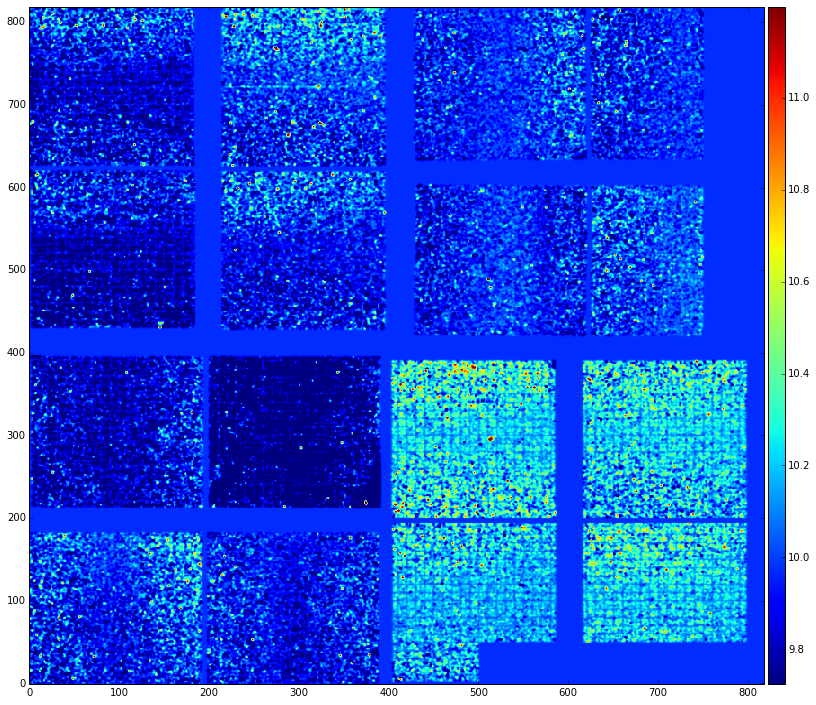

In [4]:
plot_xrd([ds], compound_list = ['MgO'], normalization = None, bgsub = False, plot_patterns = True)

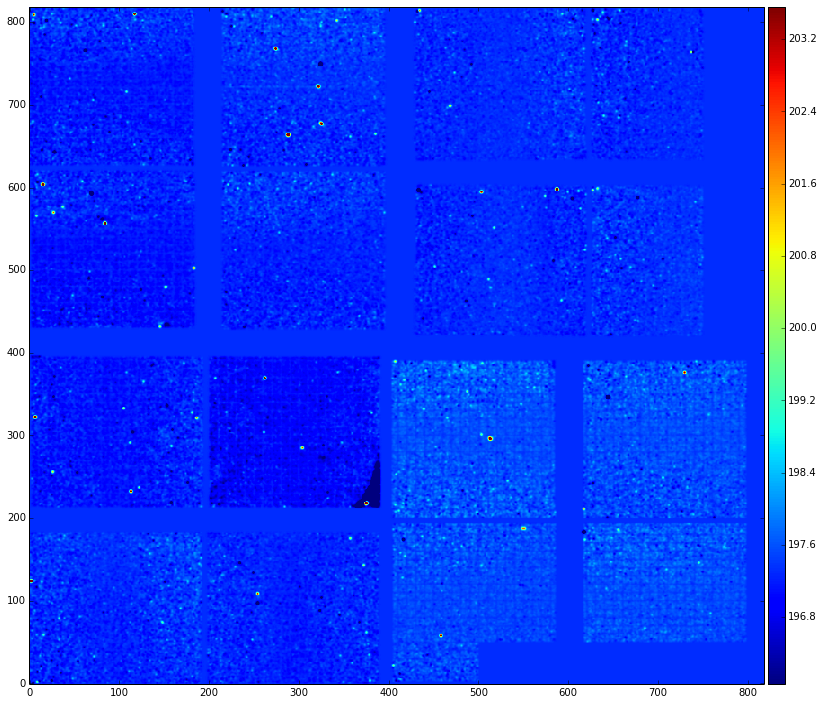

In [5]:
plot_xrd([ds], compound_list = ['MgO'], normalization = None, bgsub = False, plot_patterns = True)

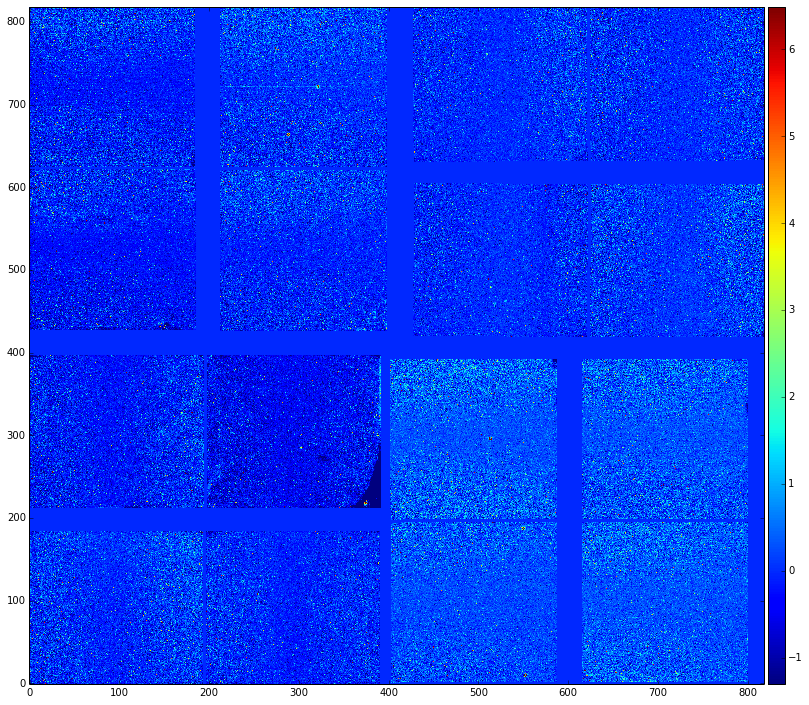

In [17]:
ds = query.DataSet([97], label = 'r%s' % str(97))
t = show([ds], 'quad2', darksub = True)

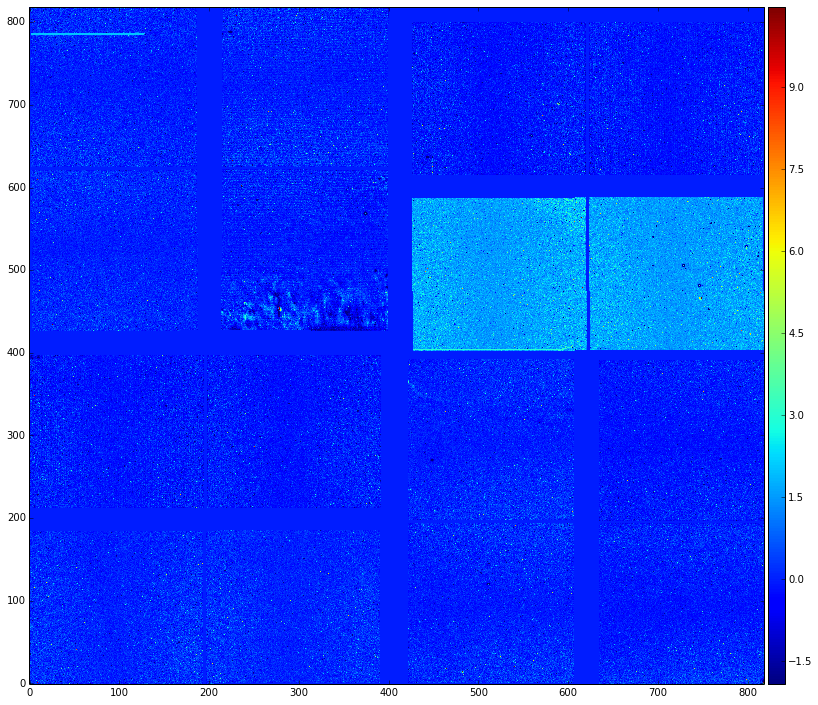

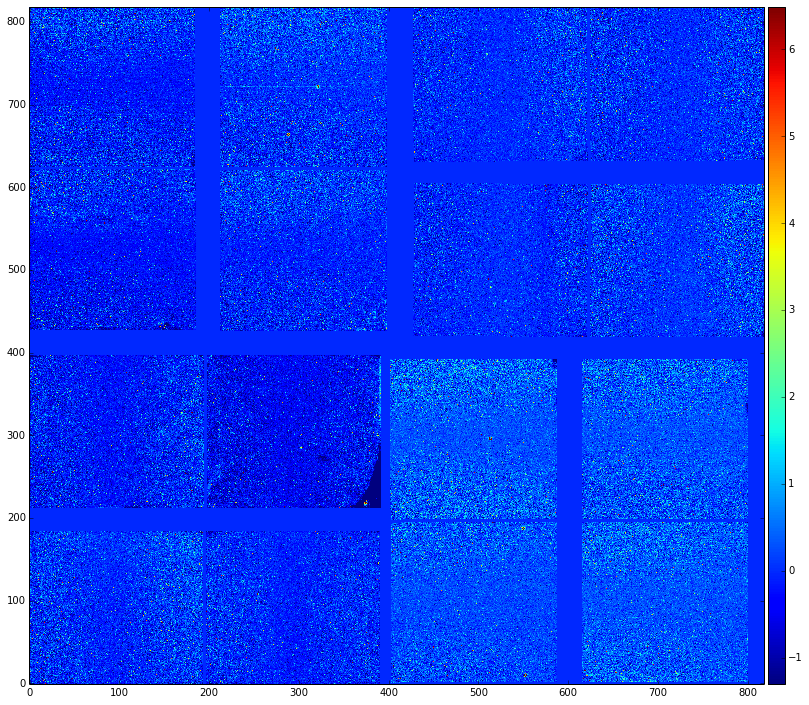

In [105]:
ds = query.DataSet([97], label = 'r%s' % str(97))
dark1 = show([ds], 'quad1', darksub = True)[0]
dark2 = show([ds], 'quad2', darksub = True)[0]


In [16]:
mt = t0[0].copy()

In [20]:
np.max(t0)

416.1487098110843

In [118]:
np.save('dark2.npy', dark2)
np.save('dark1.npy', dark1)

In [6]:
def outlier_mask(arr, min = -10, max = 10):
    mask = np.ones(arr.shape, dtype = bool)
    mask[np.logical_or(arr < min, arr > max)] = False
    return mask

def grid_mask(arr, stride = 10):
    mask = np.ones(arr.shape, dtype = bool)
    mask[::stride, :] = False
    mask[:, ::stride] = False
    return mask

dark1 = np.load('dark1.npy')
new1 = outlier_mask(dark1) * grid_mask(dark1) * m1

dark2 = np.load('dark2.npy')
new2 = outlier_mask(dark2) * grid_mask(dark2) * m2

NameError: name 'm1' is not defined

In [7]:
m1 = np.load('/reg/neh/home/ohoidn/alloy_XES_final/dataccess/tests/maskmaker/81_quad1mask_2_2.mask.npy')

In [8]:
m2 = np.load('/reg/neh/home/ohoidn/alloy_XES_final/dataccess/tests/maskmaker/mask3.npy')

In [83]:
dark2.shape

(1, 819, 819)

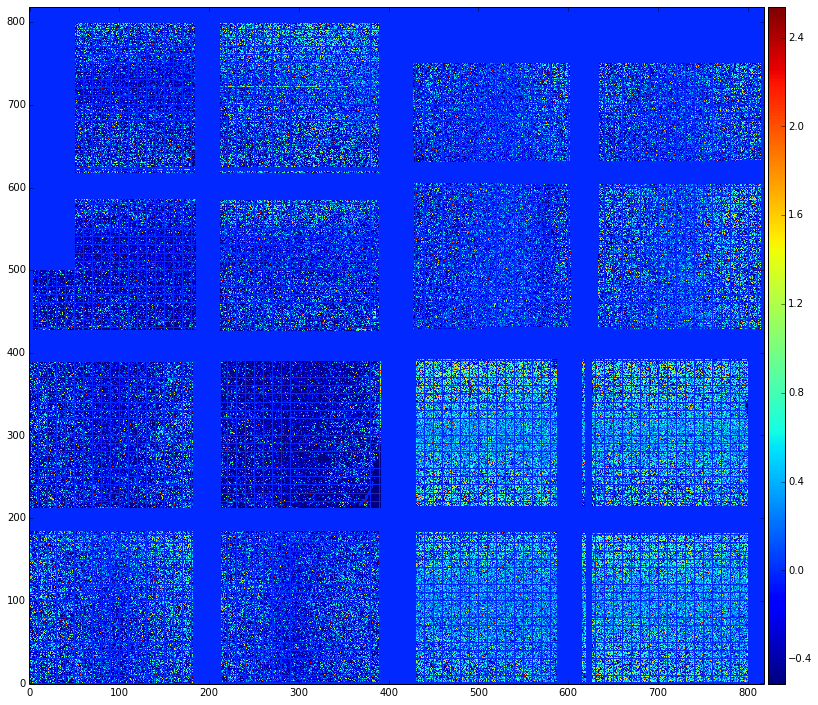

[None]

In [16]:
map(utils.show_image, [dark2 * new2])

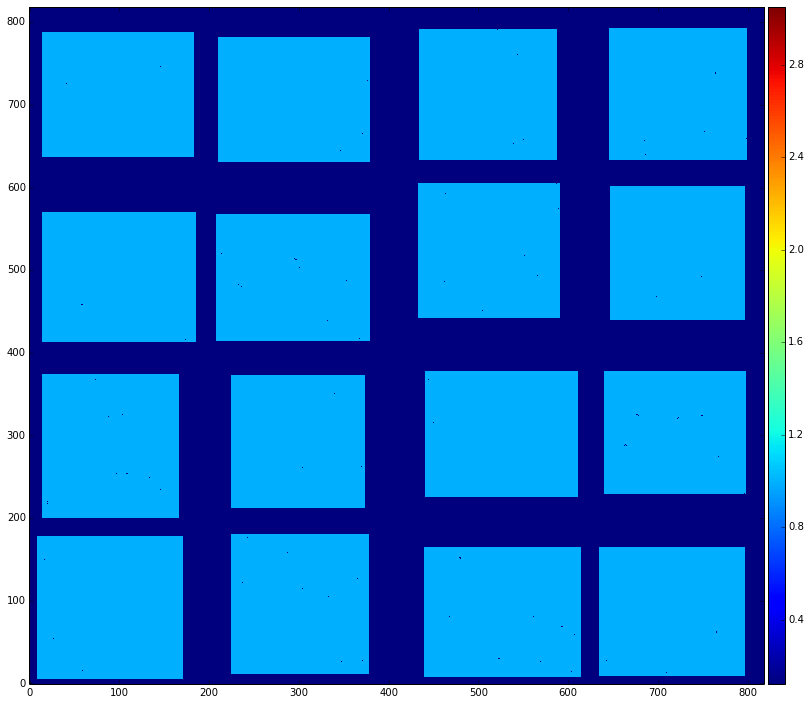

In [6]:
utils.show_image(np.load('../masks/quad2_mask_10.11.npy'))
#utils.show_image(new2)

In [11]:
np.std(t[0]), np.std(t0[0])

(1.2977150350864823, 1.3447489615091774)

89


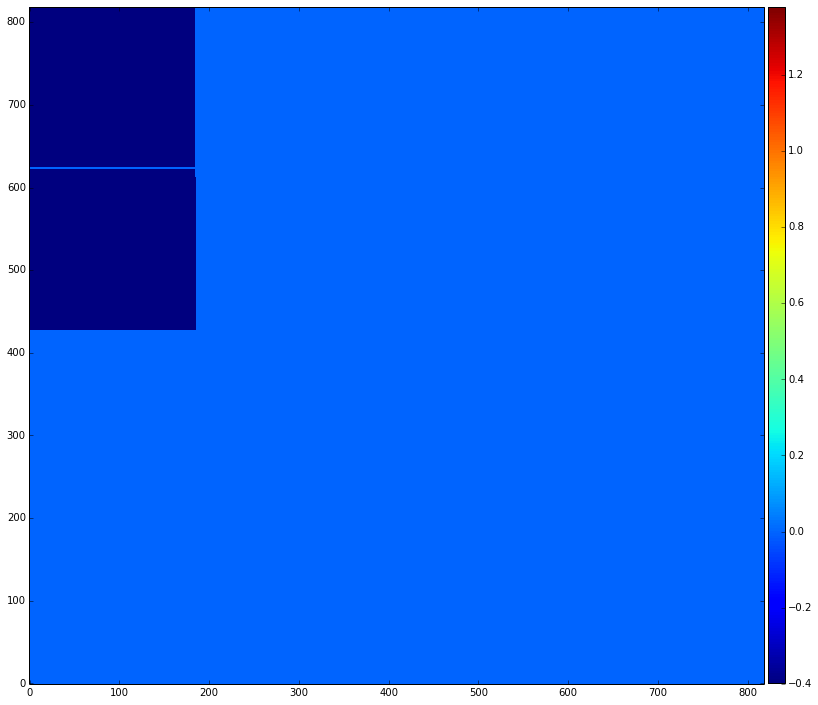

97


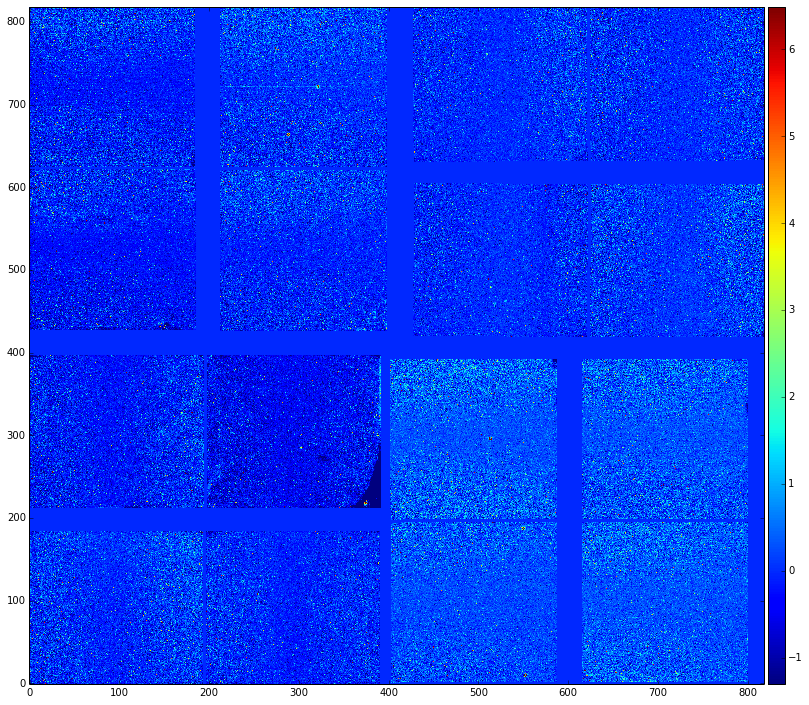

127


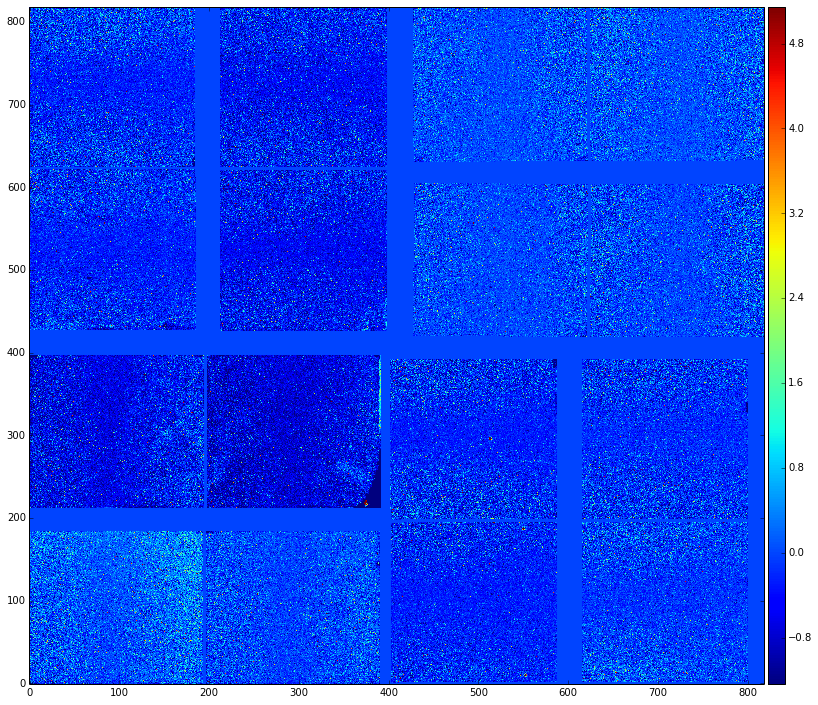

200


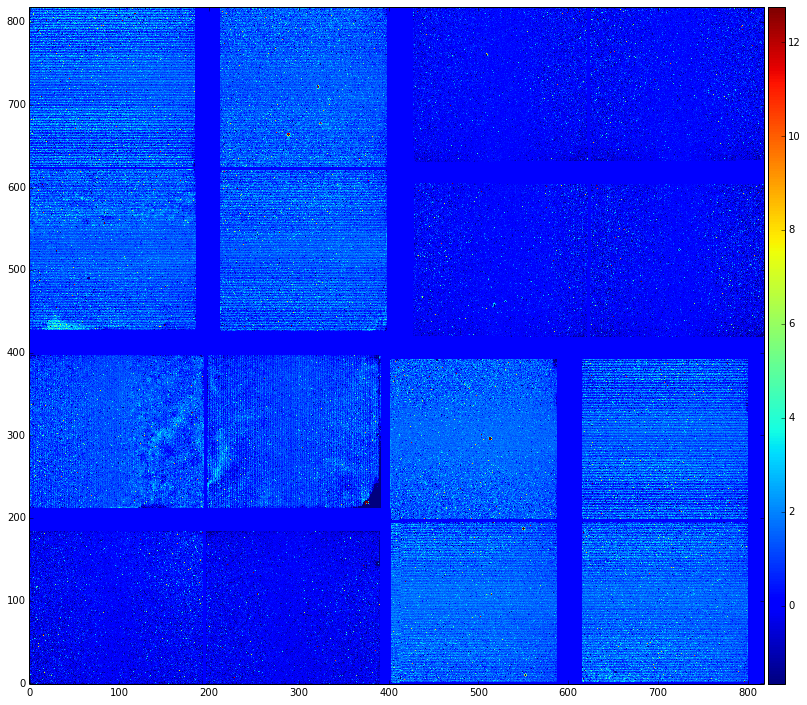

340


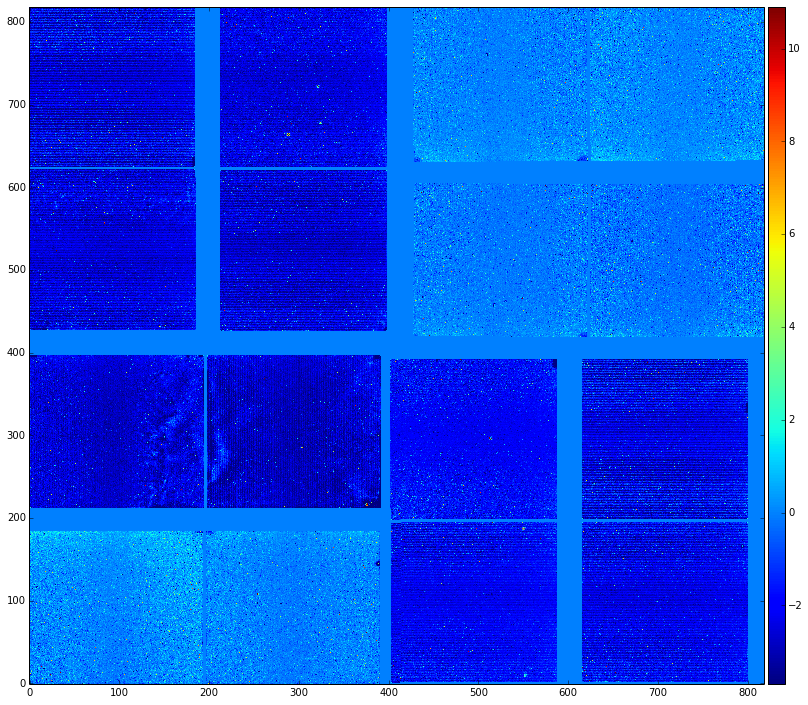

379


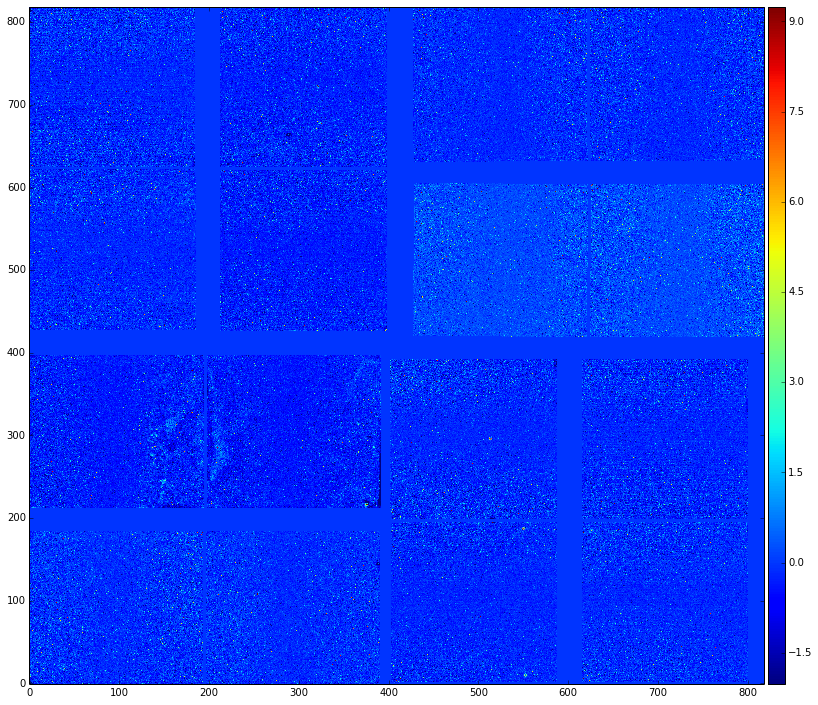

436


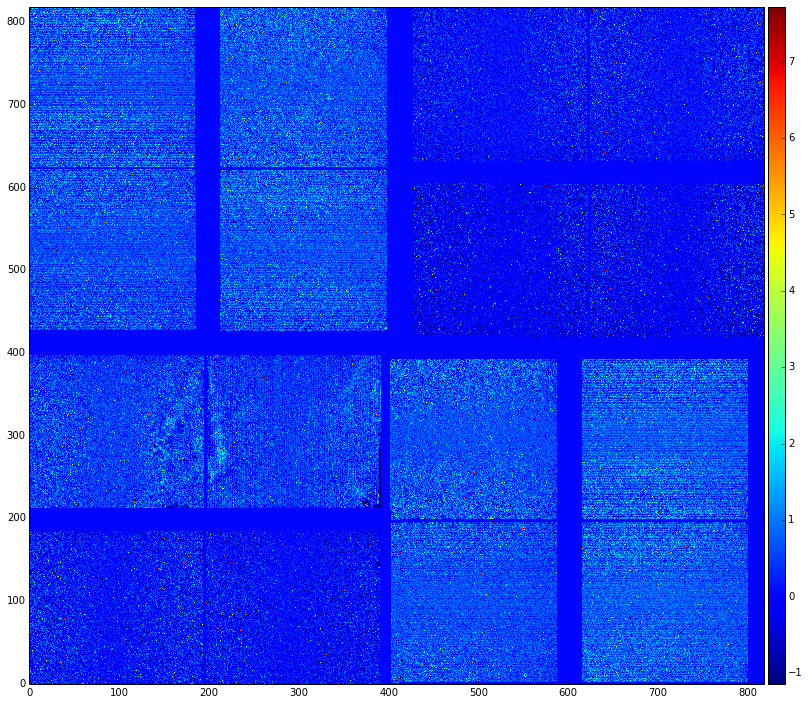

875


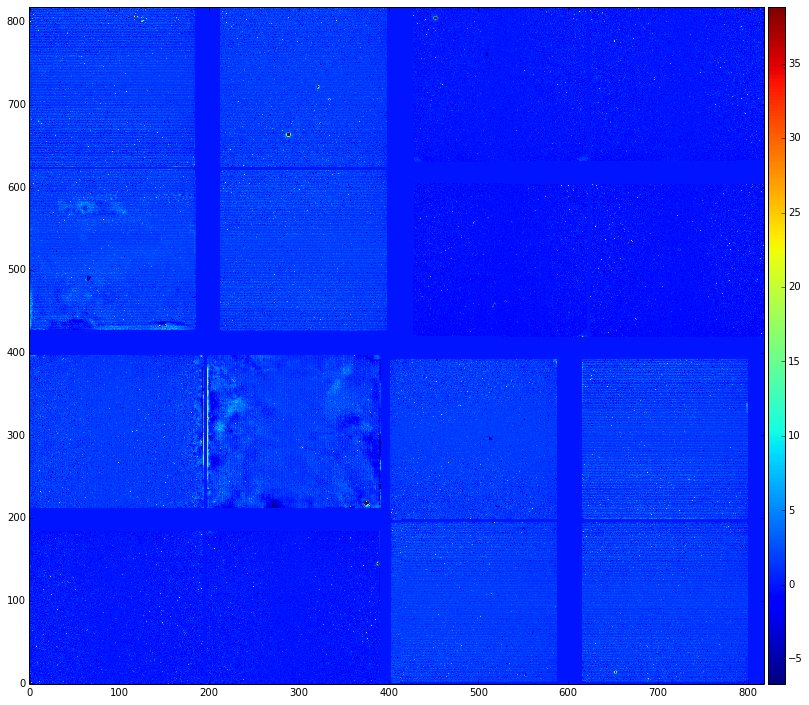

900


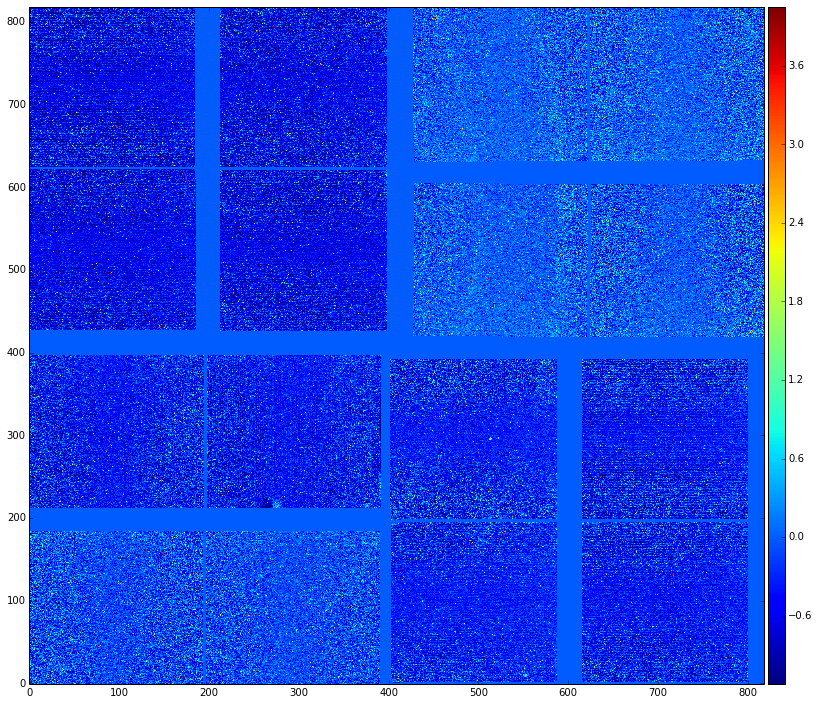

905


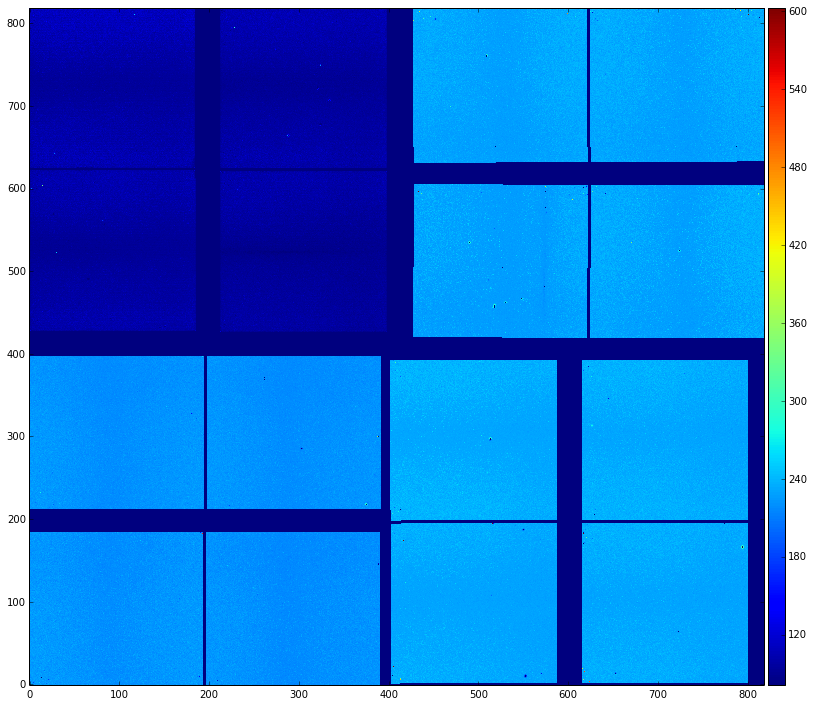

910


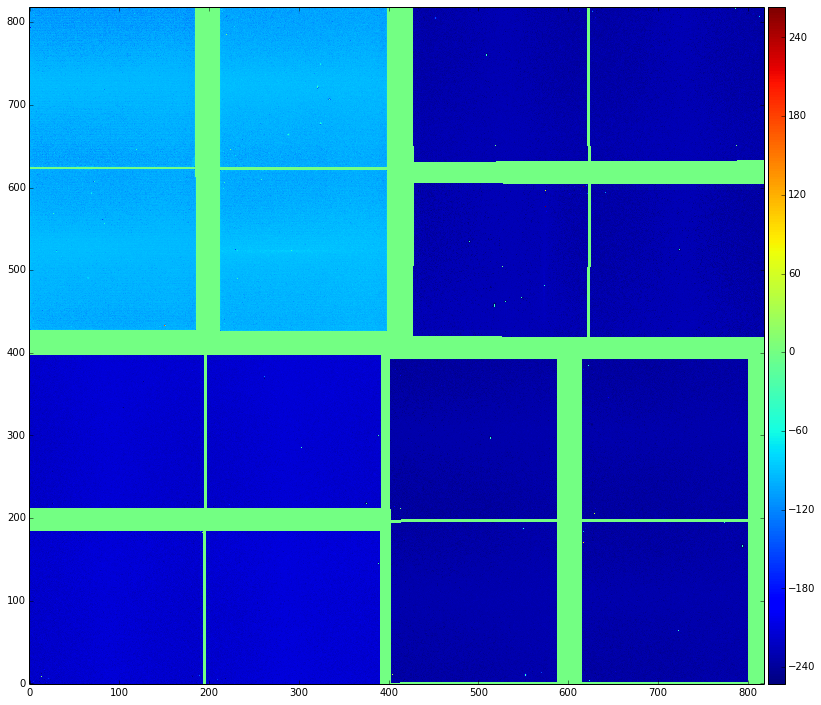

924


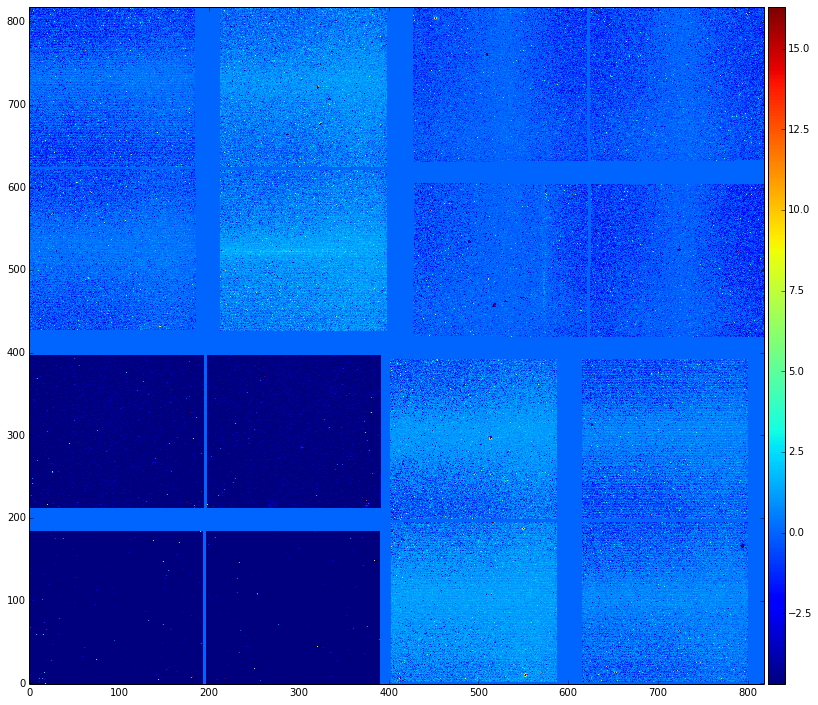

In [4]:
for r in [89, 97, 127, 200, 340, 379, 436, 875, 900, 905, 910, 924]:
    ds = query.DataSet([r], label = 'r%s' % str(r))
    print r
    _ = show([ds], 'quad2')

In [ ]:
def zero_range